In [475]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from scipy.special import expit
from matplotlib import animation

from IPython.display import HTML

%matplotlib inline  

import time

In [480]:
plt.rcParams["animation.html"] = "jshtml"

In [387]:
def load_image(filename, size = 256):
    return Image.open(filename).convert('L').resize((size, size), Image.ANTIALIAS)

def trashhold(img, alpha = None):
    if alpha is None:
        return Image.fromarray(np.array(img))
    img_array = np.array(img)
    return Image.fromarray(np.array((img_array > alpha)*255, dtype = np.uint8))

def brightness(img, alpha = None):
    if alpha is None:
        return Image.fromarray(np.array(img))
    img_array = np.array(img, dtype = np.int64)
    new_array = img_array + alpha
    new_array[np.where(new_array > 255)] = 255
    new_array[np.where(new_array < 0)] = 0
    return Image.fromarray(np.array(new_array, dtype = np.uint8))

def contrast(img, function = None, alpha = None):
    if function is None:
        if alpha is None:
            function = lambda x: expit(0.05*(x - 127.5))*255
        else:
            function = lambda x: expit(alpha*(x - 127.5))*255
    img_array = np.array(img, dtype = np.int64)
    new_array = function(img_array)
    return Image.fromarray(np.array(new_array, dtype = np.uint8))

def function(x):
    y = (x <= 50)*(0.4*x) + (x > 50)*(x < 150)*(1.8*x - 70) + (x >= 150)*(11/21*x + 850/7)
    return y

In [388]:
img = load_image('image/6.jpg')

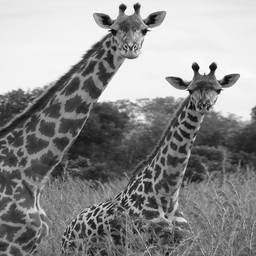

In [389]:
img

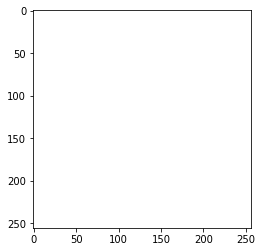

CPU times: user 1 s, sys: 68.4 ms, total: 1.07 s
Wall time: 967 ms


In [546]:
%%time
fig = plt.figure()
ims = []
for i in range(0, 255, 1):
    ims.append([plt.imshow(trashhold(img, alpha = i), animated=True)])
    pass
    
ani_trashold = animation.ArtistAnimation(fig, ims, interval=50)
plt.show()

In [547]:
HTML(ani_trashold.to_jshtml())

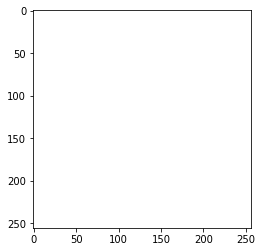

CPU times: user 438 ms, sys: 29.9 ms, total: 468 ms
Wall time: 352 ms


In [540]:
%%time

fig = plt.figure()
ims = []
for i in range(-255, 255, 10):
    ims.append([plt.imshow(brightness(img, alpha = i), animated=True)])
    pass
    
ani_brightness = animation.ArtistAnimation(fig, ims, interval=50)
plt.show()

In [541]:
HTML(ani_brightness.to_jshtml())

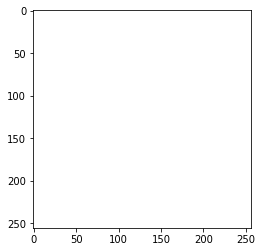

CPU times: user 615 ms, sys: 40.9 ms, total: 656 ms
Wall time: 563 ms


In [654]:
%%time

fig = plt.figure()
ims = []
list_of_point = np.hstack([np.arange(0, 50, 1)/10, np.arange(5, 11, 1), np.arange(10, 100, 2)])
for i in list_of_point:
    ims.append([plt.imshow(contrast(img, alpha = i/100), animated=True)])
    pass
    
ani_contrast = animation.ArtistAnimation(fig, ims, interval=100)
plt.show()

In [655]:
HTML(ani_contrast.to_jshtml())